# Visualizing Convolutional Neural Nets With Dog Breeds
By Karl Heyer

This project was motivated by an interest in visualizing activations in CNNs and exploring data clustering with TSNE. Our window into the world of CNNs will be a model trained to classify dog breeds trained on images from Kaggle's [Dog Breed Identification](https://www.kaggle.com/c/dog-breed-identification) challenge. Specifically we will take a pretrained ResNeXt model and fine tune it to the classification of dog breeds.

Once the model is trained, we can use it to generate breed predictions for images in the data set. The prediction for a given image will be a 1x120 vector of probabilities, where each element in the vector corresponds to the likelihood that the dog in the predicted image corresponds to each of the 120 breeds represented in the dataset. We will use TSNE to cluster these probability vectors in two dimensional space to visualize how the model classifies images.

To understand the inner workings of the model better, we will extract activations for an input image at each stage of the network to see how the input image is processed and what features are extracted.

## Contents

1. Project Setup
    * 1.1 Import Libraries
    * 1.2 High Level Data Overview
2. Model Training
3. Model Prediction Visualization
    * 3.1 Prediction Probabilities
    * 3.2 TSNE
4. Model Activations

# 1. Project Setup

## 1.1 Import Libraries

This project uses fastai, matplotlib, sklearn, scipy, pandas, and the dependencies of these libraries

In [1]:
#Notebook setup
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
#Import fast.ai library
from fastai.imports import *

In [3]:
from fastai.transforms import *
from fastai.conv_learner import *
from fastai.model import *
from fastai.dataset import *
from fastai.sgdr import *
from fastai.plots import *
from sklearn.manifold import TSNE
import seaborn as sns
import pandas as pd
import numpy as np

In [4]:
from sklearn import manifold, datasets
from sklearn.metrics.pairwise import pairwise_distances
from sklearn.metrics import confusion_matrix
from scipy.spatial.distance import squareform
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from matplotlib.ticker import NullFormatter

In [5]:
from IPython.display import Image as I
from fastai.cnn_viewer import *

In [6]:
#Set GPU
torch.cuda.set_device(1)

In [7]:
torch.cuda.is_available()

True

In [8]:
torch.backends.cudnn.enabled

True

In [9]:
#Set path to folder holding data
PATH = "data/dogbreeds/"

In [10]:
label_csv = f'{PATH}labels.csv'

In [11]:
os.listdir(f'{PATH}')

['.ipynb_checkpoints',
 'confusion.jpg',
 'confusion2.jpg',
 'labels.csv',
 'models',
 'sample_submission.csv',
 'test',
 'tmp',
 'train',
 'TSNE_distances.jpg',
 'TSNE_probabilities.jpg']

## 1.2 High Level Data Overview
In this data set the labels associated with each image are stored as a csv file

In [12]:
label_df = pd.read_csv(label_csv)
label_df.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


Lets get an idea of class representation in the dataset

In [13]:
label_df.pivot_table(index='breed', aggfunc=len).sort_values('id', ascending=False)

,id
breed,
scottish_deerhound,126
maltese_dog,117
afghan_hound,116
entlebucher,115
bernese_mountain_dog,114
shih-tzu,112
great_pyrenees,111
pomeranian,111
basenji,110


There aren't many examples for each class, but each class is relatively evenly represented in the data.

Now lets see some dogs

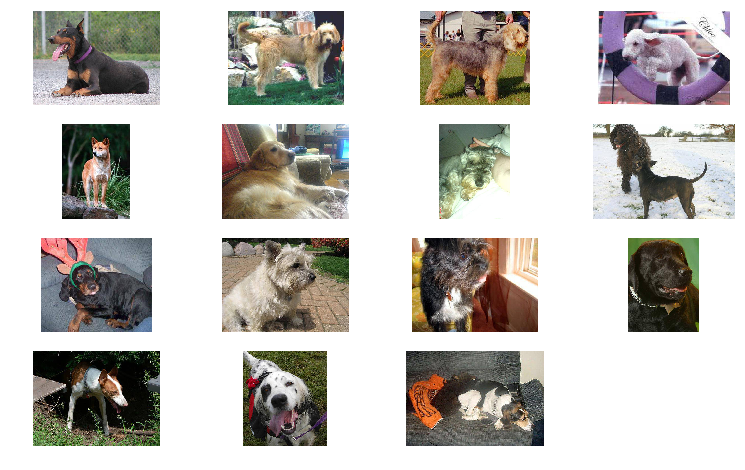

In [14]:
figure = plt.figure(figsize=(13,8))
files = os.listdir(f'{PATH}train')[20:35]

for i in range(len(files)):
    subplot = figure.add_subplot(4, 4, i+1)
    subplot.axis('off')
    img = plt.imread(f'{PATH}train/{files[i]}')
    plt.imshow(img)

Those look like some pretty standard dogs. These photos seem easy to work with - the dogs are more or less front and center in the images and there isn't a lot of other distracting features in the images. Skipping ahead a bit I'll define my model architecture now so I can use a fastai dataloader to look at the images a bit more. This next cell also defines the images we will use for a validation set, which will represent 20% of our training data set.

In [15]:
sz=244
arch=resnext101
bs=16

n = len(list(open(label_csv)))-1
val_idxs = get_cv_idxs(n)

tfms = tfms_from_model(arch, sz, aug_tfms=transforms_side_on, max_zoom=1.1)
data = ImageClassifierData.from_csv(PATH, 'train', f'{PATH}labels.csv', test_name='test',
                                       val_idxs = val_idxs, suffix='.jpg', tfms=tfms, bs=bs)

In [16]:
size_d = {k: PIL.Image.open(PATH+k).size for k in data.trn_ds.fnames}

In [17]:
row_sz, col_sz = list(zip(*size_d.values()))

In [18]:
row_sz = np.array(row_sz); col_sz = np.array(col_sz)

(array([3023., 5024.,   92.,   15.,    5.,    3.,   13.,    2.,    0.,    1.]),
 array([  97. ,  413.7,  730.4, 1047.1, 1363.8, 1680.5, 1997.2, 2313.9, 2630.6, 2947.3, 3264. ]),
 <a list of 10 Patch objects>)

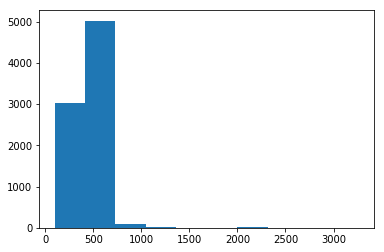

In [19]:
plt.hist(row_sz)

(array([2870., 5121.,  128.,   25.,   10.,   15.,    5.,    2.,    0.,    2.]),
 array([ 102.,  348.,  594.,  840., 1086., 1332., 1578., 1824., 2070., 2316., 2562.]),
 <a list of 10 Patch objects>)

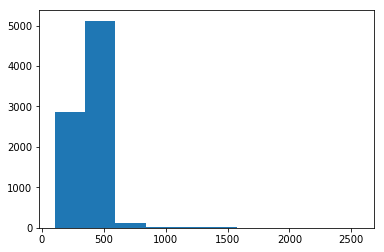

In [20]:
plt.hist(col_sz)

The sizes of the images look pretty consistent, with the exception of a few large outliers.

# 2. Model Training
Here we set up our model. Our model is a pretrained CNN with resnext101 architecture. We will train on 244x244 size images with a batch size of 16 (the small batch size is a result of the memory usage of this particular model architecture).

I won't spend too much time training the model here. The images of dogs are similar enough to ImageNet images that the pretrained weights for the model work well for this dataset, and for this project I'm more interested in visualizing outcomes than min/maxing loss and accuracy. If I was training the model for the purpose of competition this section would be more involved.

In [21]:
sz=244
arch=resnext101
bs=16

n = len(list(open(label_csv)))-1
val_idxs = get_cv_idxs(n)

tfms = tfms_from_model(arch, sz, aug_tfms=transforms_side_on, max_zoom=1.1)
data = ImageClassifierData.from_csv(PATH, 'train', f'{PATH}labels.csv', test_name='test',
                                       val_idxs = val_idxs, suffix='.jpg', tfms=tfms, bs=bs)
data.resize(300, 'tmp')

In the spirit of quick training, we're going to load the model with precompute=True. This precomputes activations in the model's pretrained layers for every image in the training and test dataset. This makes training way faster and less memory intensive.

The drawback of this approach is we can't use image augmentation during training. From an accuracy standpoint, we would really want augmentation to boost up the small sample size for each class. From a visualizing predictions standpoint, this isn't a big deal.

In [22]:
learn = ConvLearner.pretrained(arch, data, precompute=True, ps=0.5)

In [23]:
learn

Sequential(
  (0): BatchNorm1d(4096, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (1): Dropout(p=0.5)
  (2): Linear(in_features=4096, out_features=512, bias=True)
  (3): ReLU()
  (4): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (5): Dropout(p=0.5)
  (6): Linear(in_features=512, out_features=120, bias=True)
  (7): LogSoftmax()
)

When we call our learner we see only the untrained layers fastai added when the model was loaded. Later on we will see the full structure of the model. For now, we will train only these new layers, treating the frozen pretrained layers as a static function.

Next we use the learning rate finder to select an appropreate learning rate, and off we go.

In [24]:
lrf=learn.lr_find()

 78%|████████████████████████████████████████████████████▊               | 398/512 [00:03<00:01, 108.40it/s, loss=7.75]


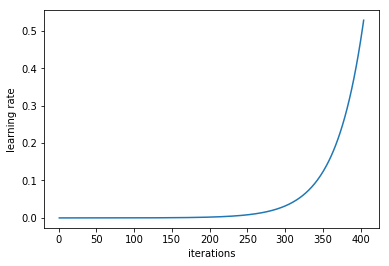

In [25]:
learn.sched.plot_lr()

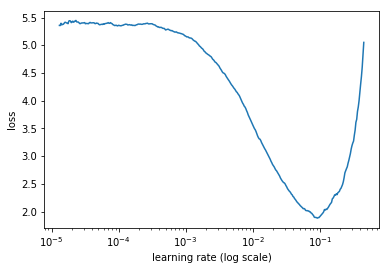

In [26]:
learn.sched.plot()

In [27]:
learn.fit(5e-2,3)

epoch      trn_loss   val_loss   accuracy                                                                              
    0      0.788011   0.451378   0.870841  
    1      0.615464   0.356797   0.898728                                                                              
    2      0.627492   0.426527   0.883072                                                                              



[array([0.42653]), 0.8830724070450098]

In [28]:
learn.fit(1e-2,3)

epoch      trn_loss   val_loss   accuracy                                                                              
    0      0.277992   0.259629   0.926125  
    1      0.268303   0.253728   0.921722                                                                              
    2      0.269444   0.235014   0.927593                                                                              



[array([0.23501]), 0.9275929549902152]

In [29]:
learn.fit(1e-3,2, cycle_len=1)

epoch      trn_loss   val_loss   accuracy                                                                              
    0      0.179063   0.234674   0.926125  
    1      0.192387   0.238621   0.926614                                                                              



[array([0.23862]), 0.9266144814090019]

91.6% accuracy accross 120 classes from minimal effor training is pretty good.

In [24]:
learn.precompute=False

In [31]:
learn.save('244_resnext101_pt03')

In [25]:
learn.load('244_resnext101_pt03')

# 3. Model Prediction Visualization
## 3.1 Prediction Probabilities

Lets make our predictions and start looking at them.

I'm choosing to use predictions on the validation set simply because it's smaller than the test set (~2000 images compared to ~10000). Thinking about the TSNE visualizations we want to do later on, running TSNE on 2000 probability vectors is fine, while running TSNE on 10000 probability vectors is painful. If I did predict on the test set I would end up taking a subset of ~2000 or so predictions anyway for TSNE, so the end result is effectively the same.

In [33]:
log_preds,y = learn.TTA()
probs = np.mean(np.exp(log_preds),0)
log_preds_avg = np.mean(log_preds,0)

In [34]:
probs.shape

(2044, 120)

In [35]:
log_preds_avg.shape

(2044, 120)

So our probability output has 2044 predictions, one for each image in the validation set. Each prediction is a vector of 120 values corresponding to the likelihood of the image being that particular class. Lets look at the first image in the validation set.

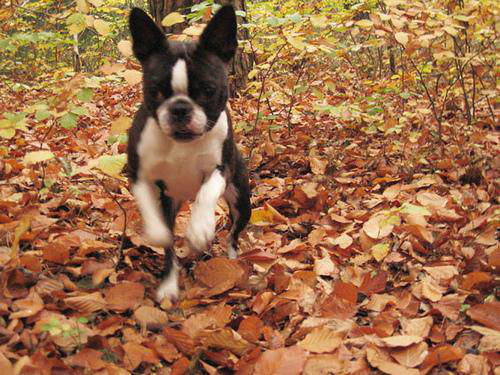

In [36]:
fn = PATH+data.val_ds.fnames[0]
img = PIL.Image.open(fn); 
img

This is the classification probability vector associated with this image. Looking that the values here, we see one class has a 0.99997 percent probability of being a particular class. The model is very confident in its prediction for this image.

In [37]:
probs[0]

array([0.     , 0.     , 0.     , 0.     , 0.     , 0.     , 0.     , 0.     , 0.     , 0.     , 0.     ,
       0.     , 0.     , 0.     , 0.     , 0.     , 0.     , 0.     , 0.     , 0.99979, 0.     , 0.     ,
       0.     , 0.     , 0.     , 0.     , 0.     , 0.     , 0.     , 0.00001, 0.     , 0.     , 0.     ,
       0.     , 0.     , 0.     , 0.     , 0.     , 0.     , 0.     , 0.     , 0.     , 0.     , 0.     ,
       0.     , 0.00018, 0.     , 0.     , 0.     , 0.     , 0.     , 0.     , 0.     , 0.     , 0.     ,
       0.     , 0.     , 0.     , 0.     , 0.     , 0.     , 0.     , 0.     , 0.     , 0.     , 0.     ,
       0.     , 0.     , 0.     , 0.     , 0.     , 0.     , 0.     , 0.     , 0.     , 0.     , 0.     ,
       0.     , 0.     , 0.     , 0.     , 0.     , 0.     , 0.     , 0.     , 0.     , 0.     , 0.     ,
       0.     , 0.     , 0.     , 0.     , 0.     , 0.     , 0.     , 0.     , 0.     , 0.     , 0.     ,
       0.     , 0.     , 0.     , 0.     , 0. 

Lets grab the class associated with this image

In [38]:
learn.data.classes[np.argmax(probs[0])]

'boston_bull'

And our model is correct!

Lets look at how the model fared with other dogs of the same breed.

In [39]:
model_results = ImageModelResults(data.val_ds, log_preds_avg)

In [40]:
model_results.most_by_correct(19, True)

array([1868,    0,  438, 1997], dtype=int64)

In [41]:
def plot_vals(idxs):
    figure = plt.figure(figsize=(12,6))
    for count, i in enumerate(idxs):
        filename = data.val_ds.fnames[i]
        subplot = figure.add_subplot(4, 4, count+1)
        subplot.axis('off')
        img = plt.imread(f'{PATH}{filename}')
        plt.imshow(img)
        subplot.set_title(probs[i][np.argmax(probs[i])], fontsize=16)

These are the top four most correct boston bulls

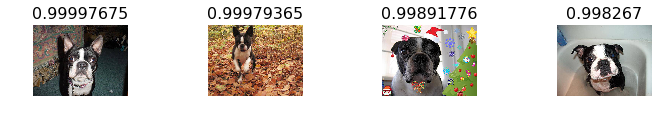

In [42]:
plot_vals(model_results.most_by_correct(19, True))

These are the most uncertain Boston bull predictions. The function that finds these looks for probabilities closest to 1/number_of_classes, in this case 1/120 or 0.0083.

Four images are shown, because that is what the function defaults to. But we can see that three of our four most uncertain Boston bull predictions are actually correct classifications (p > 0.5). Two of our most uncertain Boston bulls have above 96% confidence shows the model is doing a good job with this class.

Lets explore the two worst predictions.

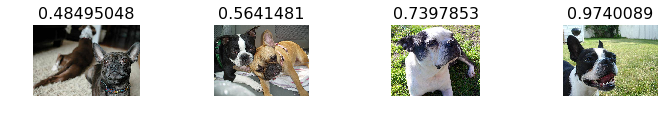

In [43]:
plot_vals(model_results.most_by_uncertain(19))

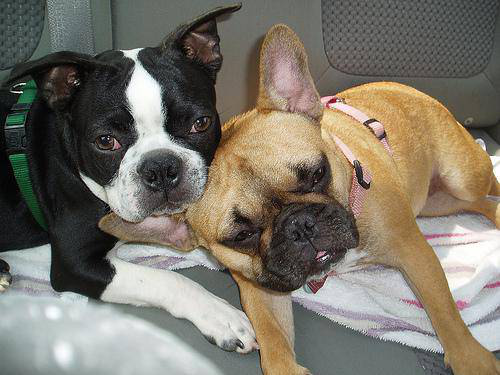

In [44]:
idx = model_results.most_by_uncertain(19)[1]
fn = PATH+data.val_ds.fnames[idx]
img = PIL.Image.open(fn); 
img

In [45]:
probs[idx]

array([0.00002, 0.     , 0.     , 0.     , 0.0018 , 0.     , 0.00006, 0.0001 , 0.00001, 0.00011, 0.     ,
       0.     , 0.     , 0.00001, 0.     , 0.     , 0.     , 0.00001, 0.     , 0.56415, 0.     , 0.00051,
       0.00002, 0.     , 0.     , 0.00013, 0.00001, 0.00003, 0.     , 0.00037, 0.     , 0.     , 0.00001,
       0.     , 0.     , 0.     , 0.     , 0.     , 0.     , 0.     , 0.     , 0.00004, 0.     , 0.00003,
       0.     , 0.41635, 0.     , 0.     , 0.     , 0.     , 0.     , 0.     , 0.     , 0.     , 0.     ,
       0.     , 0.     , 0.     , 0.     , 0.     , 0.00007, 0.     , 0.     , 0.     , 0.     , 0.     ,
       0.     , 0.00002, 0.00001, 0.     , 0.     , 0.     , 0.00001, 0.     , 0.00016, 0.00001, 0.00001,
       0.00003, 0.     , 0.     , 0.     , 0.00001, 0.     , 0.     , 0.     , 0.     , 0.00001, 0.     ,
       0.01205, 0.     , 0.     , 0.     , 0.00002, 0.     , 0.     , 0.00001, 0.     , 0.     , 0.     ,
       0.     , 0.     , 0.00001, 0.     , 0. 

In [46]:
learn.data.classes[data.val_y[idx]]

'boston_bull'

So this image is supposed to be classified Bonston bull. Looking at the probability outputs, we see a very different outcome for the first image. Rather than having one class at 99+% and the rest mostly zero, this image gets small probabilities for many different classes, suggesting the model is uncertain. The maximum probability is still the correct class, but the model makes this determination at 66% confidence rather than the 99+ we would like to see.

My guess is that seeing two dogs in the image confuses the model.

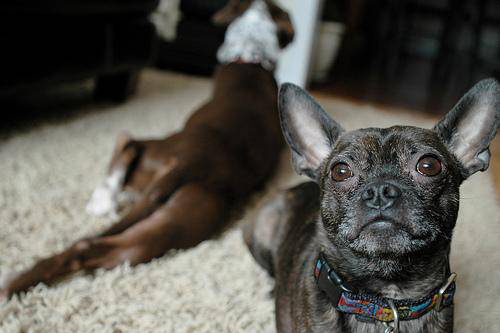

In [47]:
idx = model_results.most_by_uncertain(19)[0]
fn = PATH+data.val_ds.fnames[idx]
img = PIL.Image.open(fn); 
img

In [48]:
probs[idx]

array([0.00332, 0.00001, 0.00134, 0.     , 0.0009 , 0.00003, 0.00001, 0.00022, 0.00007, 0.00009, 0.00001,
       0.00001, 0.00001, 0.00001, 0.00001, 0.00005, 0.     , 0.00095, 0.00001, 0.03999, 0.00006, 0.0007 ,
       0.00053, 0.     , 0.     , 0.00006, 0.01027, 0.01296, 0.0005 , 0.24603, 0.     , 0.     , 0.00006,
       0.     , 0.00027, 0.00014, 0.00057, 0.0005 , 0.00001, 0.     , 0.00001, 0.00001, 0.     , 0.00013,
       0.00004, 0.48495, 0.00004, 0.00012, 0.00002, 0.00001, 0.00001, 0.00001, 0.     , 0.00002, 0.00006,
       0.00028, 0.00016, 0.00002, 0.00005, 0.00001, 0.00118, 0.     , 0.     , 0.00243, 0.0004 , 0.     ,
       0.00002, 0.00011, 0.00078, 0.     , 0.00101, 0.00001, 0.03071, 0.00005, 0.11833, 0.00017, 0.00069,
       0.00075, 0.     , 0.     , 0.00051, 0.00001, 0.     , 0.     , 0.00011, 0.00002, 0.00073, 0.     ,
       0.01989, 0.00155, 0.     , 0.00003, 0.00002, 0.     , 0.     , 0.00234, 0.0023 , 0.00002, 0.     ,
       0.     , 0.00005, 0.00014, 0.00001, 0.0

In [49]:
learn.data.classes[data.val_y[idx]]

'boston_bull'

This image was incorrectly classified. Lets look at the top five predictions for the image:

In [50]:
[(learn.data.classes[i], probs[idx][i]) for i in np.argsort(probs[idx])[::-1][:5]]

[('french_bulldog', 0.48495048),
 ('chihuahua', 0.2460349),
 ('mexican_hairless', 0.118332684),
 ('boston_bull', 0.03999457),
 ('malinois', 0.030706773)]

In this image, the correct class Boston bull was beat out by Affenpinscher. This image also has second dog in the background, which may be confusing the model. 

In [51]:
predictions = np.argmax(probs,axis=1)

In [52]:
cm = confusion_matrix(y, predictions)

In [53]:
def plot_confusion_matrix(cm, classes, normalize=False, title='Confusion matrix', cmap=plt.cm.Blues, figsize=None):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    (This function is copied from the scikit docs.)
    """
    plt.figure(figsize=figsize)
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=90)
    plt.yticks(tick_marks, classes)

    if normalize: cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    print(cm)
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j], horizontalalignment="center", color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.savefig(f'{PATH}confusion.jpg', bbox_inches = 'tight')
    plt.close()

In [148]:
plot_confusion_matrix(cm, data.classes, figsize=(40,40))

[[20  0  0 ...  0  0  0]
 [ 0 22  0 ...  0  0  0]
 [ 0  0 26 ...  0  0  0]
 ...
 [ 0  0  0 ... 13  0  0]
 [ 0  0  0 ...  0 13  0]
 [ 0  0  0 ...  0  0 16]]


This function makes a full plot of the confusion matrix for all 120 classes that is far too large to show inline in the notebook, but it's worth a look. Most classes are correctly labeled. Incorrect labels seem to happen between similar looking dog breeds.

6 American Staffordshire terriers were classified as Staffordshire bull terriers.
7 Eskimo dogs were classified as Siberian huskies. 3 Eskimo dogs were classified as malamutes.
7 Lakeland terriers were classified as wire haired fox terriers.

Other incorrect classifications has 1-2 examples per class.

## 3.2 TSNE
We can use TSNE to decompose our 120 dimensional probability vectors into 2 dimensional space. We can then plot the two dimensional probabilities to see how different classes cluster in 2 dimensional space.

TSNE will use joint probabilities between prediction vectors to create a low dimensional embedding of a high dimensional space.

In [54]:
probs_trans = manifold.TSNE(n_components=2, perplexity=15).fit_transform(probs)

In [55]:
prob_df = pd.DataFrame(np.concatenate((probs_trans, y[:,None]), axis=1), columns=['x','y','labels'])

In [56]:
prob_df.head()

,x,y,labels
0,-7.911168,26.392258,19.0
1,-21.565039,-41.674213,15.0
2,-59.777069,-39.019539,7.0
3,-35.484985,8.764050,99.0
4,12.496395,7.830442,73.0


This is what our data looks like in two dimensions according to TSNE. We can see distinct clusters forming. Due to the limitations of the color palette, the plot with every class shown is hard to interpret. We can get a better idea of what is going on by looking at only a few classes at a time. 

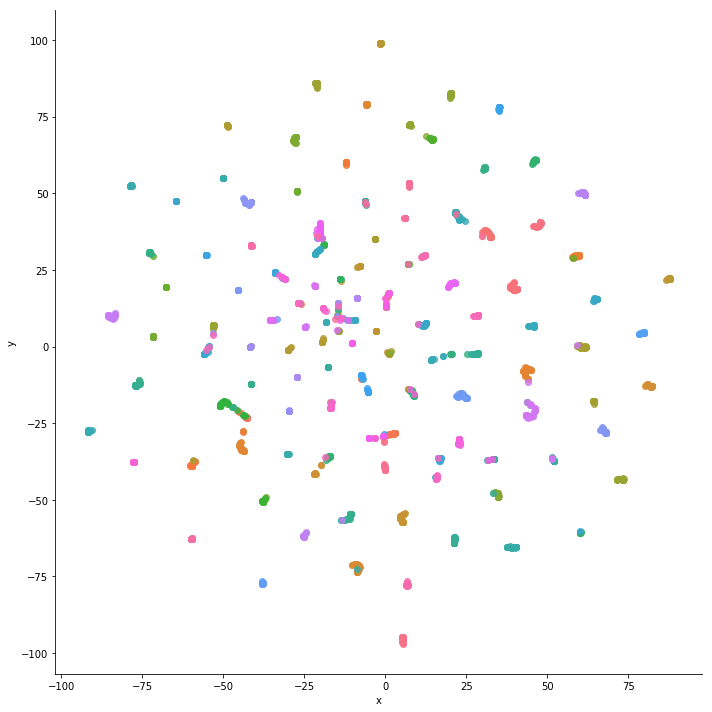

In [57]:
g = sns.lmplot('x', 'y', data=prob_df, hue='labels', fit_reg=False, legend=False, size=10)

In [58]:
prob_df['fname'] = learn.data.val_ds.fnames

In [59]:
prob_df.head()

,x,y,labels,fname
0,-7.911168,26.392258,19.0,train\000bec180eb18c7604dcecc8fe0dba07.jpg
1,-21.565039,-41.674213,15.0,train\00214f311d5d2247d5dfe4fe24b2303d.jpg
2,-59.777069,-39.019539,7.0,train\003df8b8a8b05244b1d920bb6cf451f9.jpg
3,-35.484985,8.764050,99.0,train\004396df1acd0f1247b740ca2b14616e.jpg
4,12.496395,7.830442,73.0,train\00693b8bc2470375cc744a6391d397ec.jpg


In [60]:
prob_samp = prob_df[prob_df['labels'].isin(np.random.randint(1,100, 5))].sample(frac=1, axis=0)

In this plot we can see some nice clustering. Each of the five classes represented here occupies a distinct space, which is what we want to see. These spatial differences are representative of how similar model predictions for a given class are to other predictions of the same class, and how different predictions for one class are from another.

While we have good clustering, we also see outliers for most classes, suggesting the model struggles with some images.

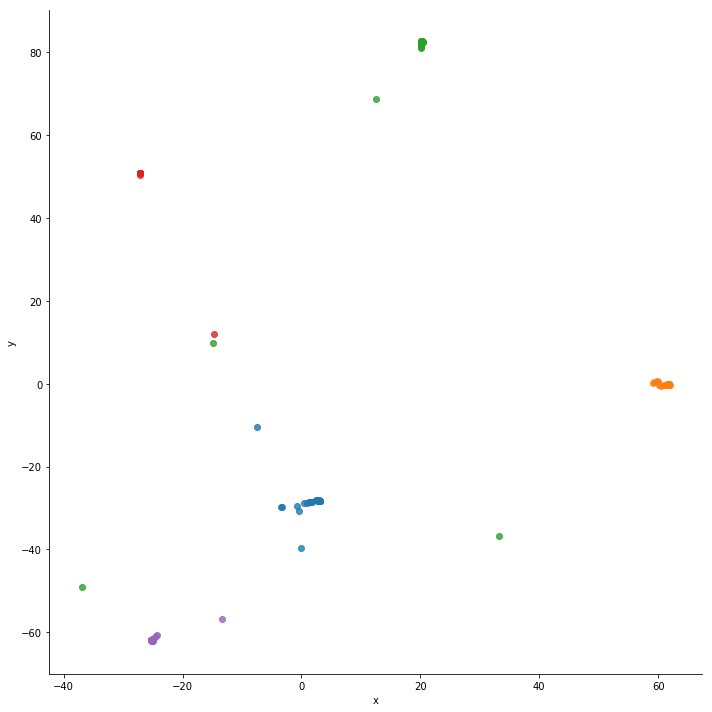

In [61]:
g = sns.lmplot('x', 'y', data=prob_samp, hue='labels', fit_reg=False, legend=False, size=10)

Another interesting way to view the data is to first compute the pairwise distances for all the output probabilities, and then perform TSNE on those values. This has the effect of exaggerating the differences within a class.

In [49]:
distances = pairwise_distances(probs)

c:\users\gateway\anaconda2\envs\tensorflow-gpu\lib\site-packages\sklearn\metrics\pairwise.py:257: RuntimeWarning: invalid value encountered in sqrt
  return distances if squared else np.sqrt(distances, out=distances)


In [50]:
dist_trans = manifold.TSNE(n_components=2, perplexity=5).fit_transform(distances)

In [51]:
dist_df = pd.DataFrame(np.concatenate((dist_trans, y[:,None]), axis=1), columns=['x','y','labels'])

In [52]:
dist_df.head()

,x,y,labels
0,73.723747,30.302279,19.0
1,-38.558758,-73.057556,15.0
2,27.315424,-29.369043,7.0
3,-36.338612,-18.898764,99.0
4,52.784737,85.596230,73.0


Rather than clusters we can now have classes falling into a squiggly line shape. This representation also shows how a large number of single images congregate in the center of the plot with no real clustering or separation from other images, while well defined clusters/lines appear further away from the origin with more space to themselves.

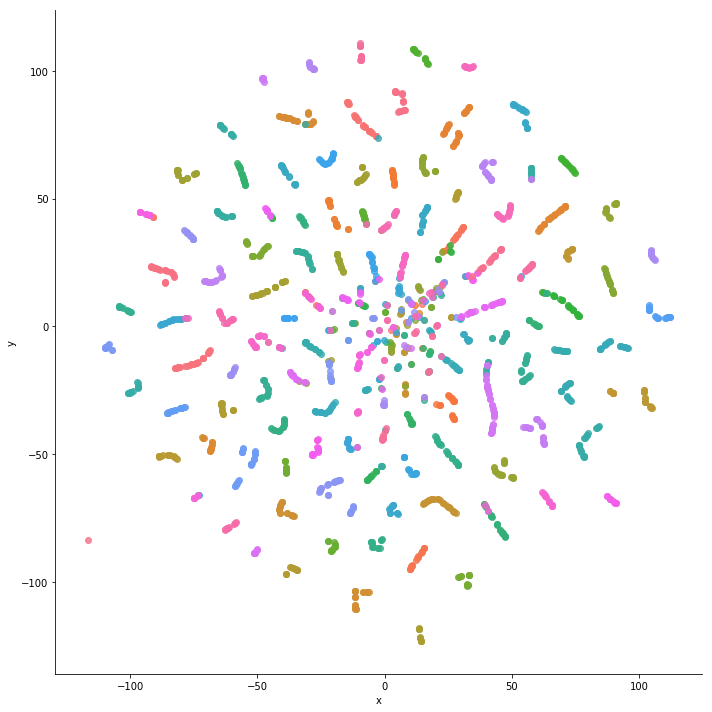

In [53]:
h = sns.lmplot('x', 'y', data=dist_df, hue='labels', fit_reg=False, legend=False, size=10)

In [54]:
dist_df['fname'] = learn.data.val_ds.fnames

In [55]:
dist_df.head()

,x,y,labels,fname
0,73.723747,30.302279,19.0,train\000bec180eb18c7604dcecc8fe0dba07.jpg
1,-38.558758,-73.057556,15.0,train\00214f311d5d2247d5dfe4fe24b2303d.jpg
2,27.315424,-29.369043,7.0,train\003df8b8a8b05244b1d920bb6cf451f9.jpg
3,-36.338612,-18.898764,99.0,train\004396df1acd0f1247b740ca2b14616e.jpg
4,52.784737,85.596230,73.0,train\00693b8bc2470375cc744a6391d397ec.jpg


In [56]:
dist_samp = dist_df[dist_df['labels'].isin(np.random.randint(1,100, 5))].sample(frac=1, axis=0)

This representation gives an interesting view of class outliers. In this view, we see how class outliers (poor predictions) appear more similar to other poor predictions than to the classes they belong to.

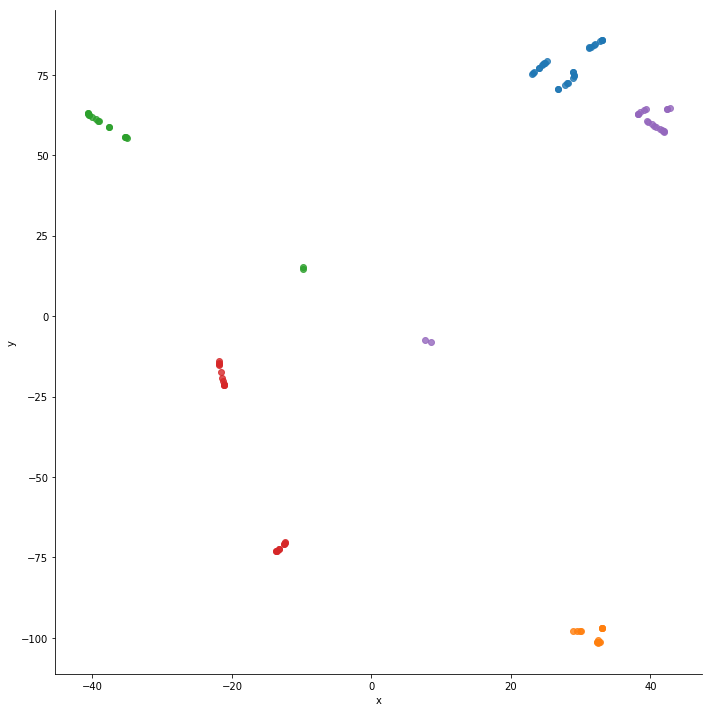

In [57]:
g = sns.lmplot('x', 'y', data=dist_samp, hue='labels', fit_reg=False, legend=False, size=10)

To make these datapoints a little more real, lets plot them with their corresponding images overlayed. This plot will likely be too large to see any detail inline in the notebook, but feel free to look at the full size image in the repo.

In [72]:
def visualize_scatter_with_images(scaled_data, df, figsize=(64,64), image_zoom=1, suffix=1):
    fig, ax = plt.subplots(figsize=figsize)
    artists = []
    xx = scaled_data[:,0]
    yy = scaled_data[:,1]
    
    for i, (x,y) in enumerate(zip(xx,yy)):
        im = PIL.Image.open(PATH + df['fname'][i])
        im.thumbnail((64,64))
        img = OffsetImage(im, zoom=image_zoom, cmap='gray')
        ab = AnnotationBbox(img, (x, y), xycoords='data', frameon=False)
        artists.append(ax.add_artist(ab))
    ax.update_datalim(np.column_stack([xx,yy]))
    ax.autoscale()
    
    plt.show()
    fig.savefig(f'{PATH}TSNE_{suffix}.jpg', bbox_inches = 'tight')

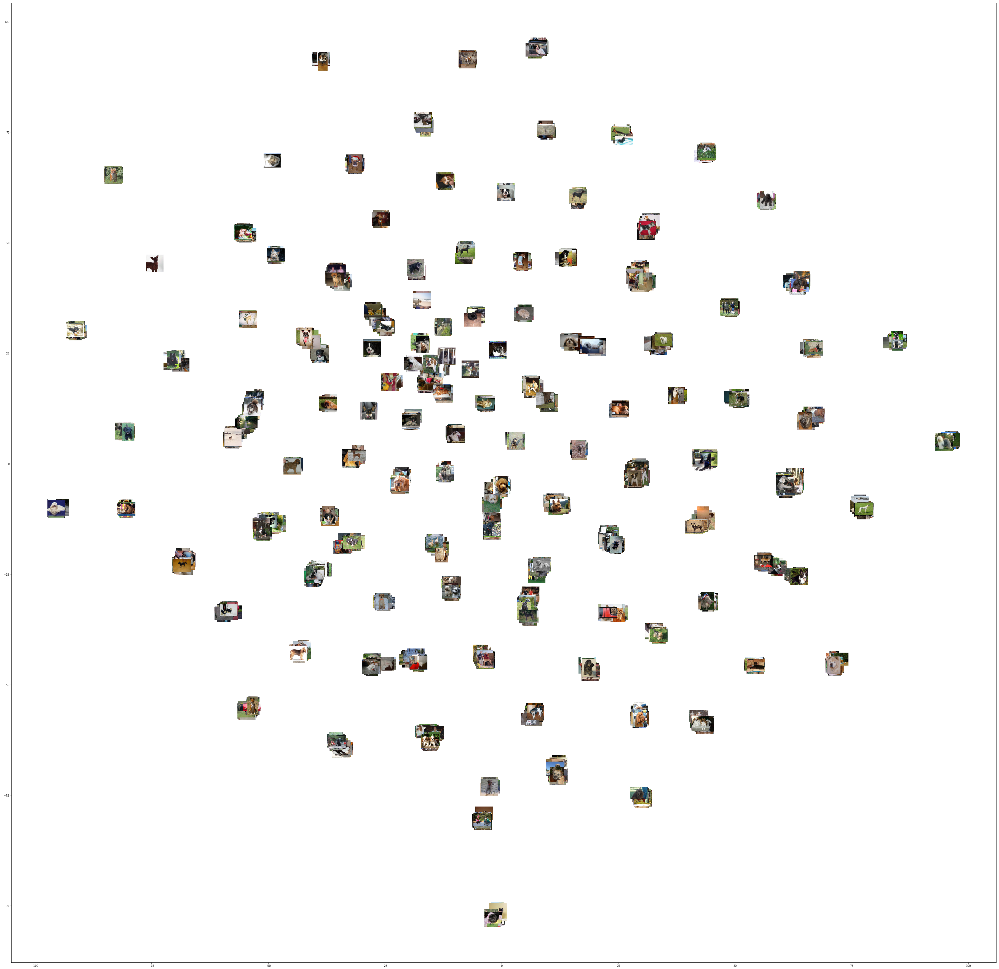

In [73]:
visualize_scatter_with_images(probs_trans, prob_df, image_zoom=1, suffix='probabilities')

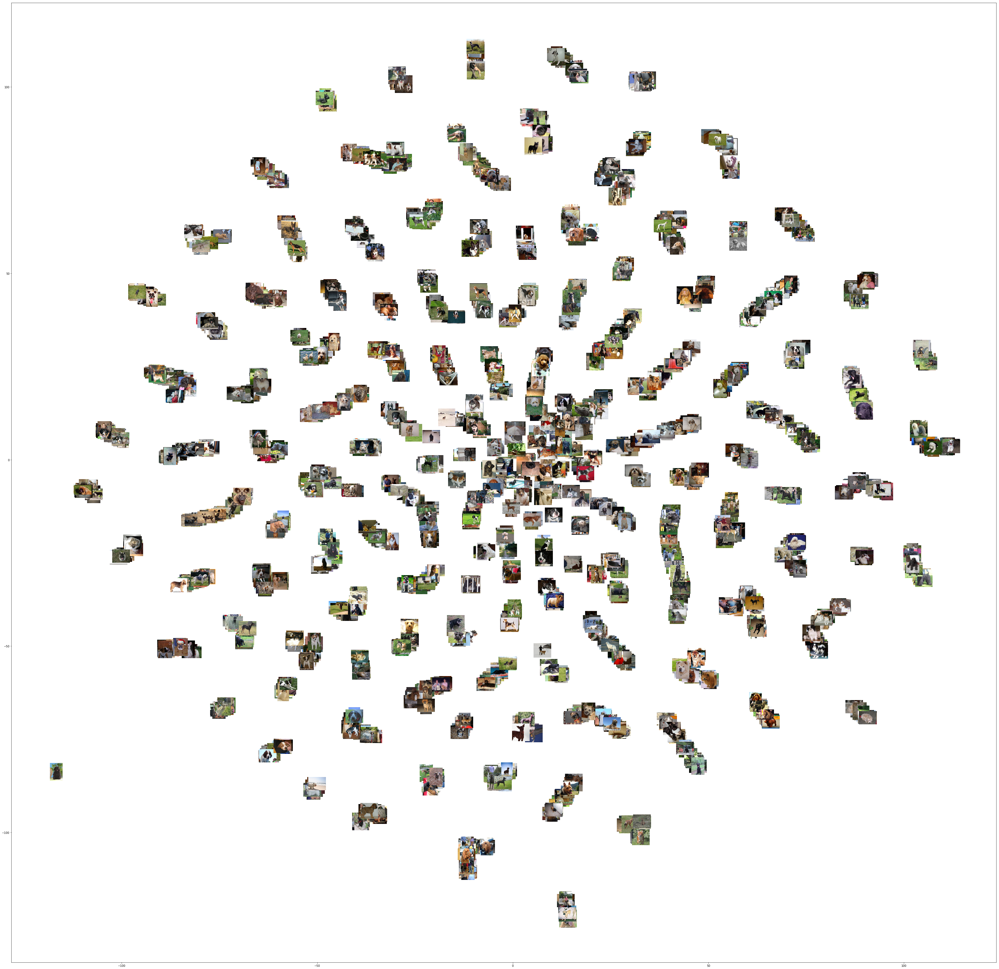

In [74]:
visualize_scatter_with_images(dist_trans, dist_df, image_zoom=1, suffix='distances')

# 4. Model Activations
Now it's time to look inside the model and see what goes on when an image passes through. The functions used to perform this analysis can be found in the cnn_viewer.py file, and should work with any CNN in fastai that takes a 3 channel image as input. 

Basically what happens is the image moves through the network, represented as a tensor of different sizes. As the image goes deeper into the network, the cross section of the image gets smaller while the length of the tensor gets larger. The functions used here save the tensor of activations at each layer of the network and convert them to images. 

First we need to select an image

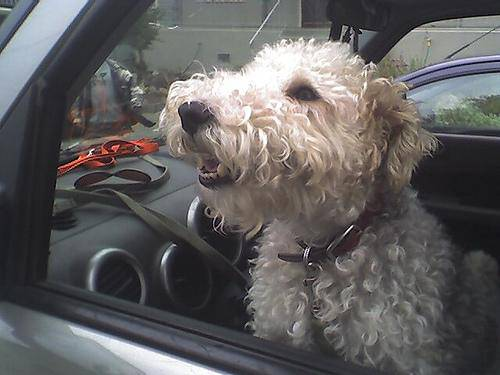

In [26]:
filename = data.val_ds.fnames[1500]
I(PATH+filename)

There's a good dog. Now we input the image filename and our model into the plot_cnn_visuals function

In [28]:
trn_tfms, val_tfms = tfms_from_model(arch, sz)
model=learn.model
model.eval()
acts = plot_cnn_visuals(PATH, filename, model, transformer=val_tfms, total_layers=9,
                    resize=(512,512), animation_interval=250, folder_suffix='_dog1')

Processing Layer:  0
Processing Layer:  1
Processing Layer:  2
Processing Layer:  3
Processing Layer:  4
Processing Layer:  5
Processing Layer:  6
Processing Layer:  7
Processing Layer:  8
Animating Layer:  0
Animating Layer:  1
Animating Layer:  2
Animating Layer:  3
Animating Layer:  4
Animating Layer:  5
Animating Layer:  6
Animating Layer:  7
Animating Layer:  8


What's happening under the hood is the function passes the image through the model and saves the output activations from each main block of the network and saves them. We can see what's going on with some of the helper functions in cnn_viewer.py

First we have to process the image with val_tfms. This ensures the image loaded from the filename given is scaled and normalized the same way as the data the network trained on. Then we can turn the processed image array into a Pytorch variable.

In [30]:
fn = PATH+filename
i = val_tfms(open_image(fn))
i = i[None]
i = torch.from_numpy(i)
i = i.cuda()
tmp_model = get_activation_layer(model)
layer_outputs = tmp_model(V(i))

In [31]:
[i.shape for i in layer_outputs]

[torch.Size([1, 3, 244, 244]),
 torch.Size([1, 64, 122, 122]),
 torch.Size([1, 64, 122, 122]),
 torch.Size([1, 64, 122, 122]),
 torch.Size([1, 64, 61, 61]),
 torch.Size([1, 256, 61, 61]),
 torch.Size([1, 512, 31, 31]),
 torch.Size([1, 1024, 16, 16]),
 torch.Size([1, 2048, 8, 8]),
 torch.Size([1, 4096, 1, 1]),
 torch.Size([1, 4096]),
 torch.Size([1, 4096]),
 torch.Size([1, 4096]),
 torch.Size([1, 512]),
 torch.Size([1, 512]),
 torch.Size([1, 512]),
 torch.Size([1, 512]),
 torch.Size([1, 120])]

Here you can see the output shapes for each of the 18 main blocks in the network. For plotting images, I've selected only the first 9 layers. The two dimensional layers don't make sense for trying to form an image, and the final four dimensional layer takes a lot of memory to process.

In [32]:
def plot_individuals(layer, ims, suffix):
    figure = plt.figure(figsize=(20,20))
    
    for i in range(ims):
        filename = f'{PATH}individuals{suffix}/layer{layer}_image{i}.jpg'
        subplot = figure.add_subplot(4,4, i+1)
        subplot.axis('off')
        img = plt.imread(filename)
        plt.imshow(img)

This is the first layer of activations having shape [1, 3, 244, 244]

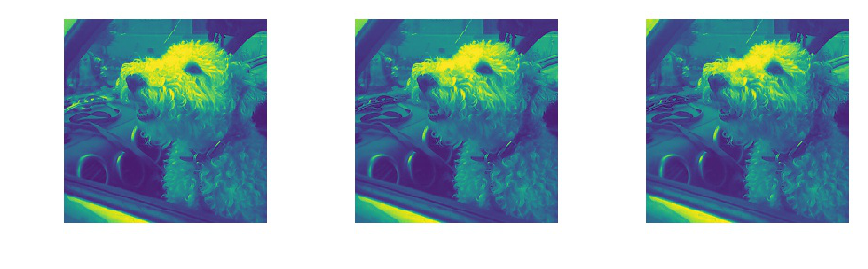

In [33]:
plot_individuals(0,3, '_dog1')

In the next three layers, all with shape [1, 64, 122, 122], we start to see the model identifying edges, contrasts, and the head of the dog

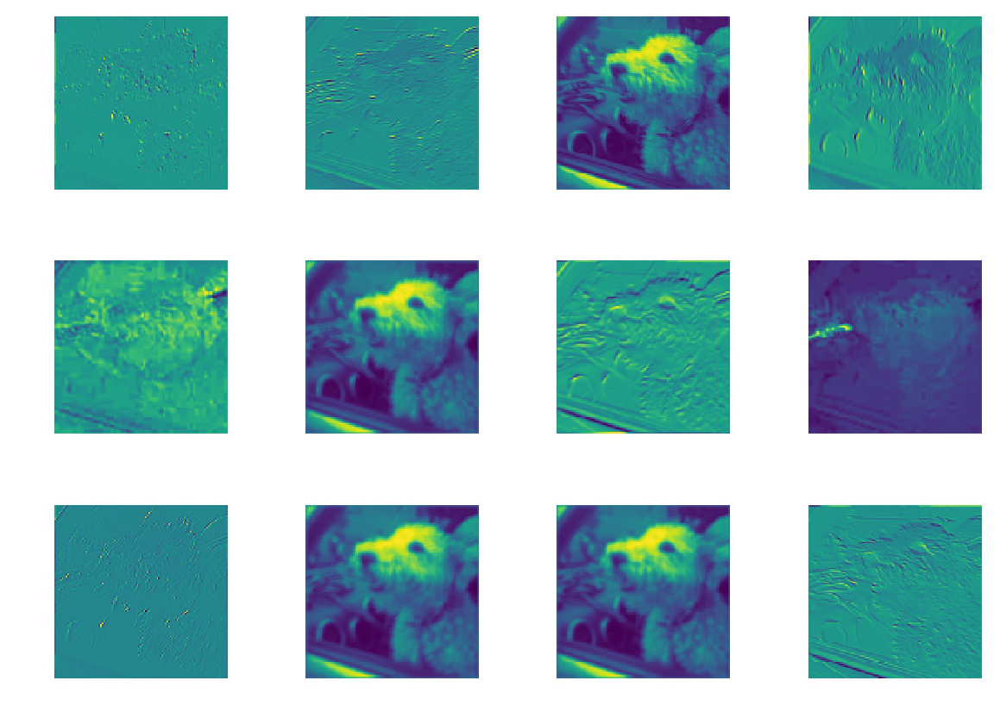

In [34]:
plot_individuals(1,12, '_dog1')

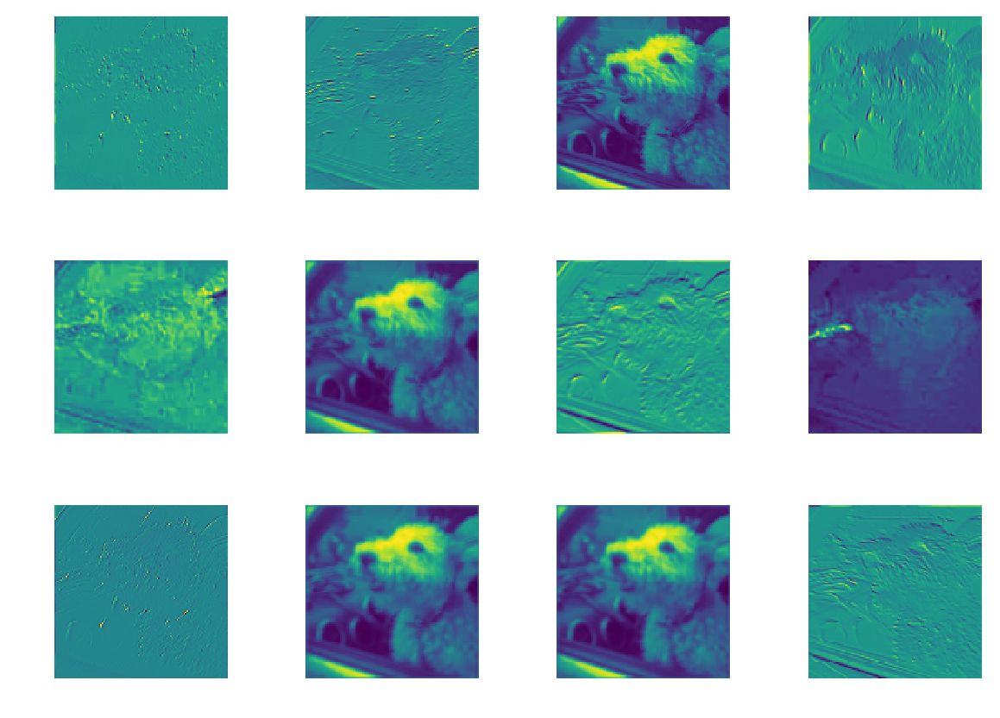

In [35]:
plot_individuals(2,12, '_dog1')

This next section is interesting. It looks like certain activations have been turned off.

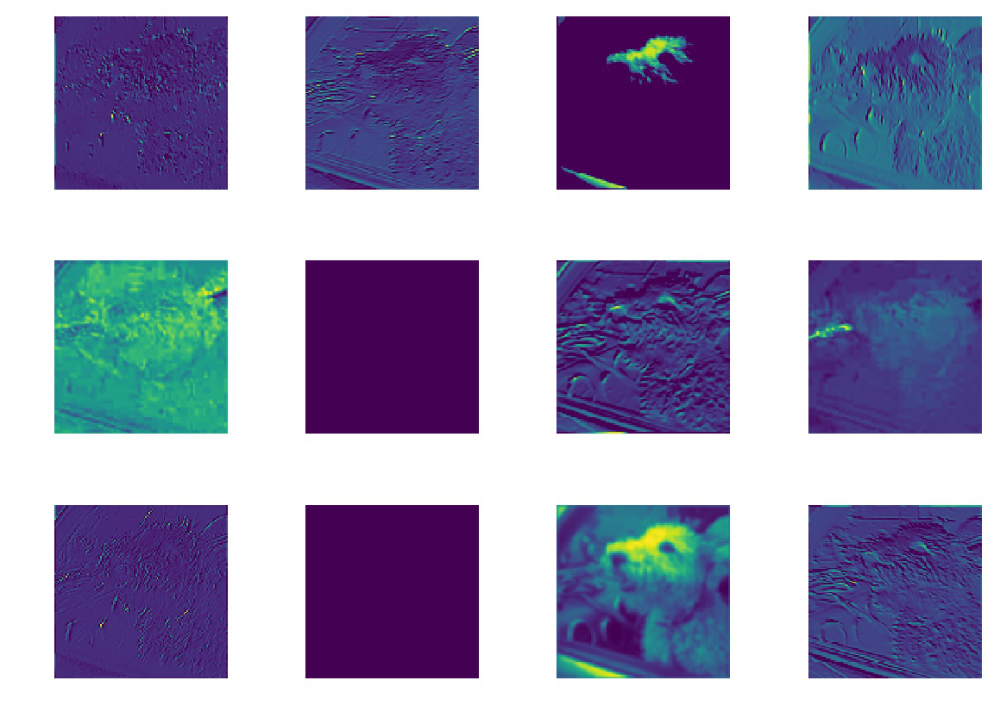

In [36]:
plot_individuals(3,12, '_dog1')

This next set of activations has shape [1, 64, 61, 61]. Some of the images here really bring out the outline of the dog

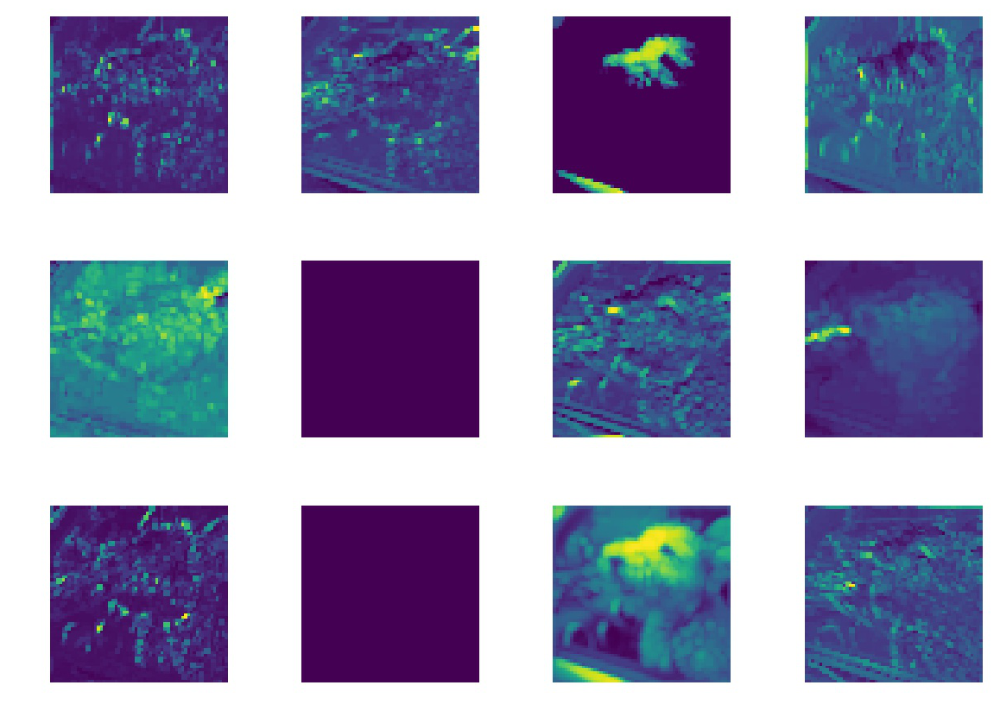

In [37]:
plot_individuals(4,12, '_dog1')

These activations are of shape [1, 256, 61, 61]. Features look more refined

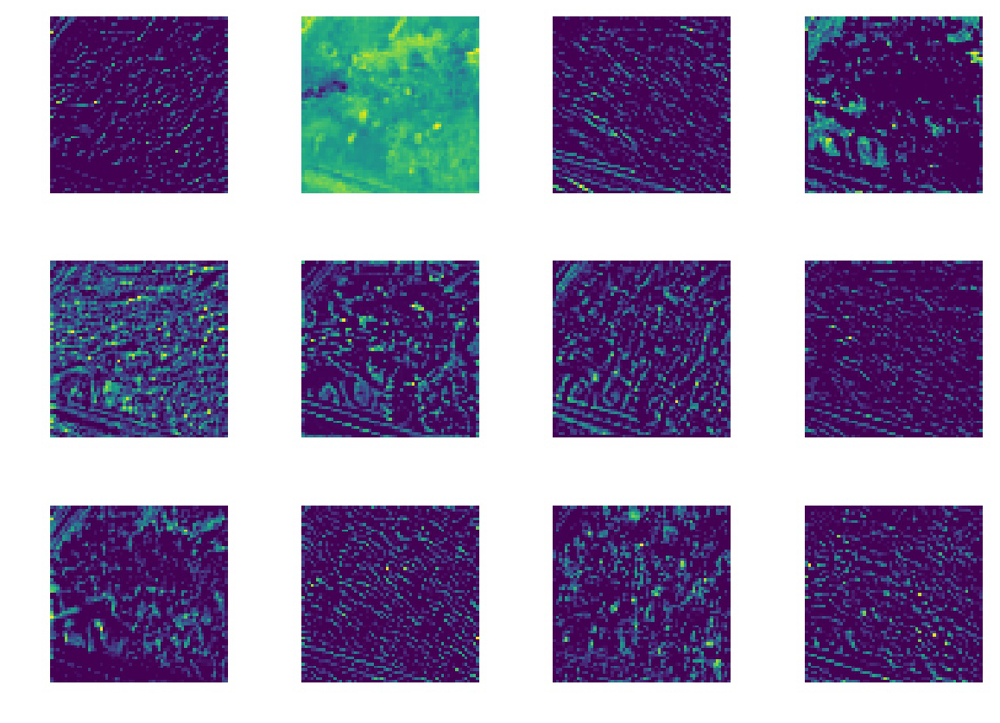

In [38]:
plot_individuals(5,12, '_dog1')

These activations are of shape [1, 512, 31, 31]

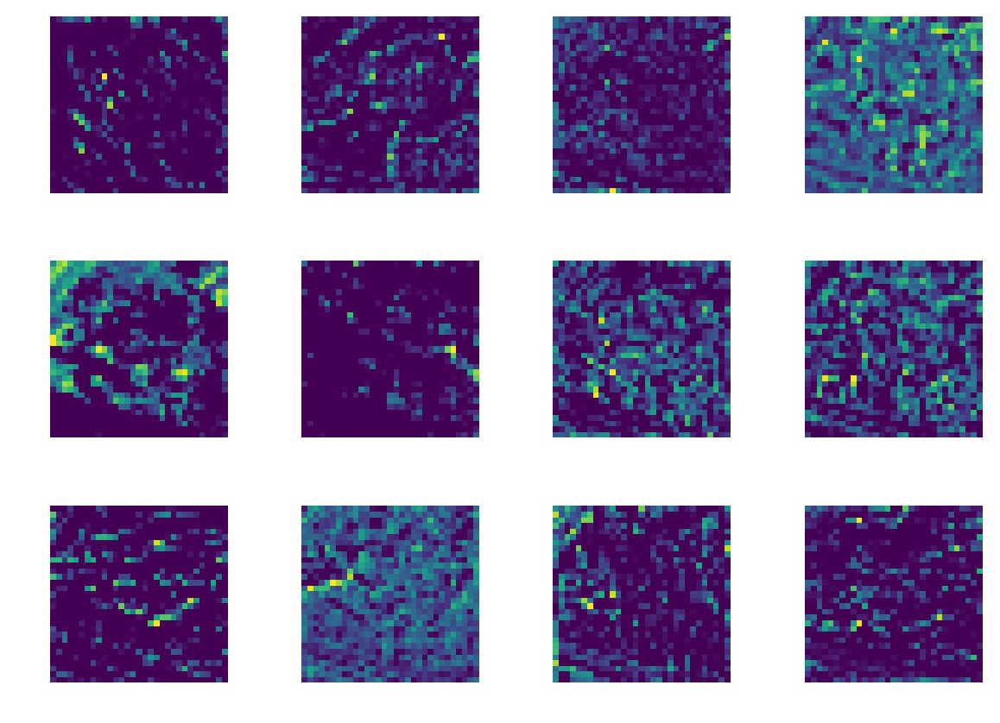

In [39]:
plot_individuals(6,12, '_dog1')

These activations are of shape [1, 1024, 16, 16]. Now we start to see small points of high activation

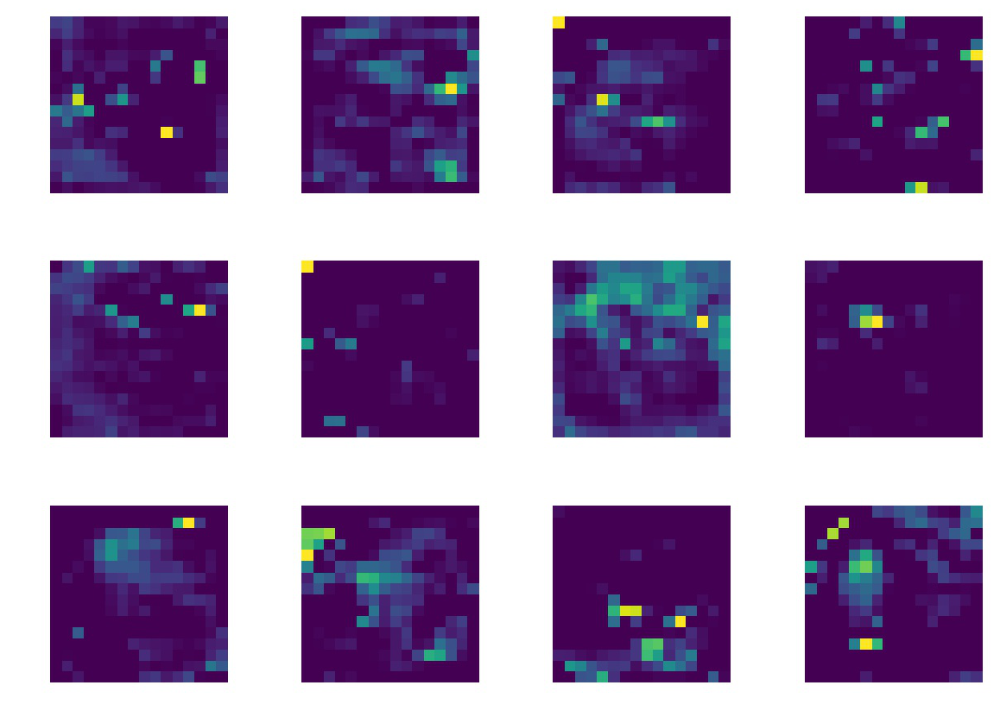

In [40]:
plot_individuals(7,12, '_dog1')

And finally the [1, 2048, 8, 8] activations

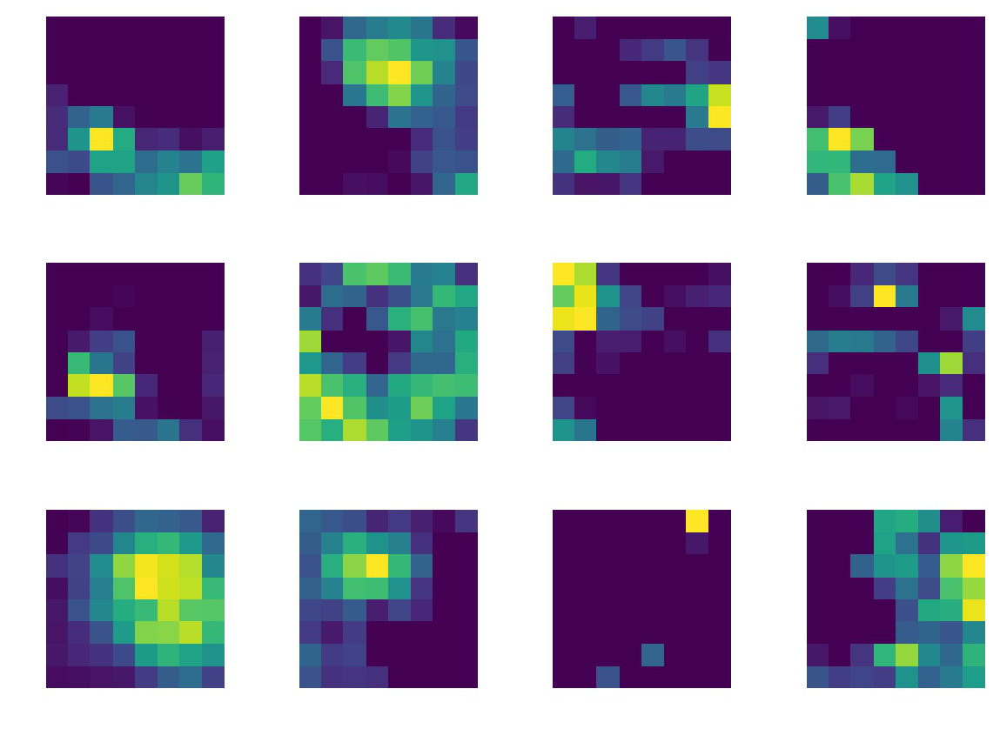

In [41]:
plot_individuals(8,12, '_dog1')

The plot_cnn_visuals function also created an mp4 animation of the activations in order from the first layer processed to the last

<video controls src="data/dogbreeds/animation_dog1/cnn_animation.mp4" />